In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
from warnings import filterwarnings
filterwarnings('ignore')

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler


In [22]:
data = pd.read_csv('air quality data.csv')
data.drop(columns= ['Date', 'AQI_Bucket'], inplace=True)
data.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
0,Ahmedabad,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN
1,Ahmedabad,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN
2,Ahmedabad,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN
3,Ahmedabad,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN
4,Ahmedabad,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN


In [23]:
data.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24933.000000,18391.000000,25949.000000,25946.000000,25346.000000,19203.000000,27472.000000,25677.000000,25509.000000,23908.000000,21490.000000,11422.000000,24850.000000
mean,67.450578,118.127103,17.574730,28.560659,32.309123,23.483476,2.248598,14.531977,34.491430,3.280840,8.700972,3.070128,166.463581
std,64.661449,90.605110,22.785846,24.474746,31.646011,25.684275,6.962884,18.133775,21.694928,15.811136,19.969164,6.323247,140.696585
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,28.820000,56.255000,5.630000,11.750000,12.820000,8.580000,0.510000,5.670000,18.860000,0.120000,0.600000,0.140000,81.000000
50%,48.570000,95.680000,9.890000,21.690000,23.520000,15.850000,0.890000,9.160000,30.840000,1.070000,2.970000,0.980000,118.000000
75%,80.590000,149.745000,19.950000,37.620000,40.127500,30.020000,1.450000,15.220000,45.570000,3.080000,9.150000,3.350000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [24]:
data.isnull().sum()

City           0
PM2.5       4598
PM10       11140
NO          3582
NO2         3585
NOx         4185
NH3        10328
CO          2059
SO2         3854
O3          4022
Benzene     5623
Toluene     8041
Xylene     18109
AQI         4681
dtype: int64

In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   City     29531 non-null  object 
 1   PM2.5    24933 non-null  float64
 2   PM10     18391 non-null  float64
 3   NO       25949 non-null  float64
 4   NO2      25946 non-null  float64
 5   NOx      25346 non-null  float64
 6   NH3      19203 non-null  float64
 7   CO       27472 non-null  float64
 8   SO2      25677 non-null  float64
 9   O3       25509 non-null  float64
 10  Benzene  23908 non-null  float64
 11  Toluene  21490 non-null  float64
 12  Xylene   11422 non-null  float64
 13  AQI      24850 non-null  float64
dtypes: float64(13), object(1)
memory usage: 3.2+ MB


In [26]:
data.shape

(29531, 14)

In [27]:
data.duplicated().sum()

np.int64(2297)

In [28]:
data1 = data.dropna(subset=['AQI'], inplace=True)

In [29]:
data.isnull().sum().sort_values(ascending=False)

Xylene     15372
PM10        7086
NH3         6536
Toluene     5826
Benzene     3535
NOx         1857
O3           807
PM2.5        678
SO2          605
CO           445
NO2          391
NO           387
City           0
AQI            0
dtype: int64

In [30]:
null_values_percentage = (data.isnull().sum() / data.isnull().count()*100).sort_values(ascending=False)
print(null_values_percentage)

Xylene     61.859155
PM10       28.515091
NH3        26.301811
Toluene    23.444668
Benzene    14.225352
NOx         7.472837
O3          3.247485
PM2.5       2.728370
SO2         2.434608
CO          1.790744
NO2         1.573441
NO          1.557344
City        0.000000
AQI         0.000000
dtype: float64


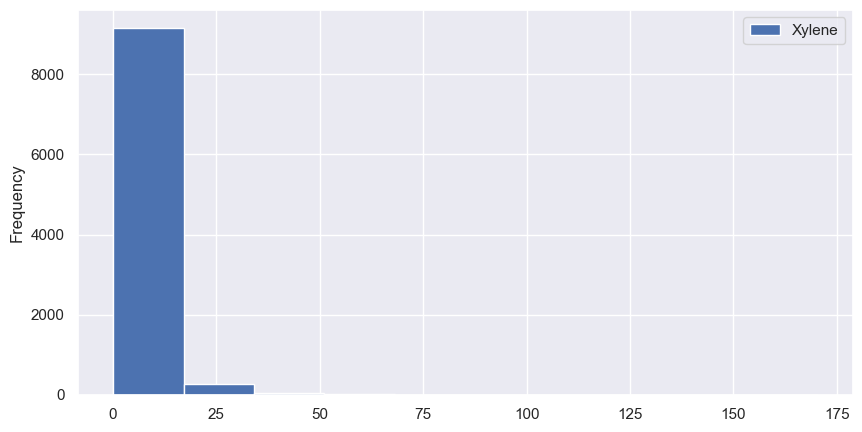

In [31]:
data['Xylene'].plot(kind='hist', figsize=(10,5))
plt.legend()
plt.show()

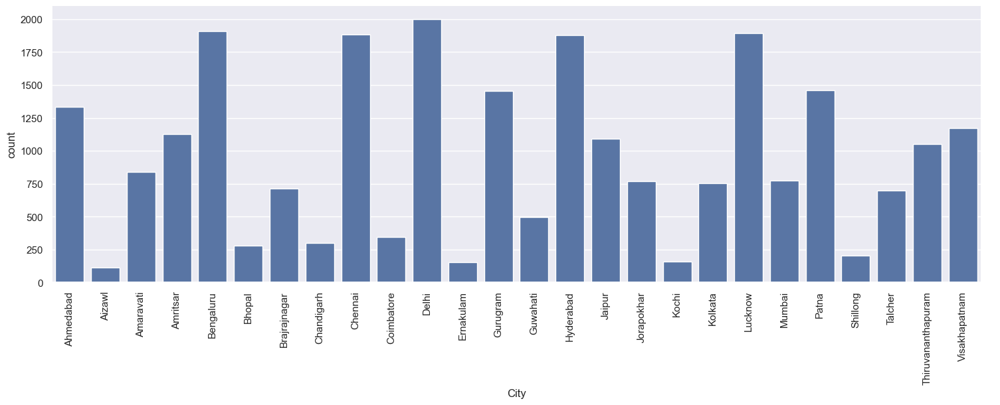

In [32]:
sns.set_theme(style='darkgrid')
graph=sns.catplot(x="City",kind="count",data=data,height=5,aspect=3)
graph.set_xticklabels(rotation=90)

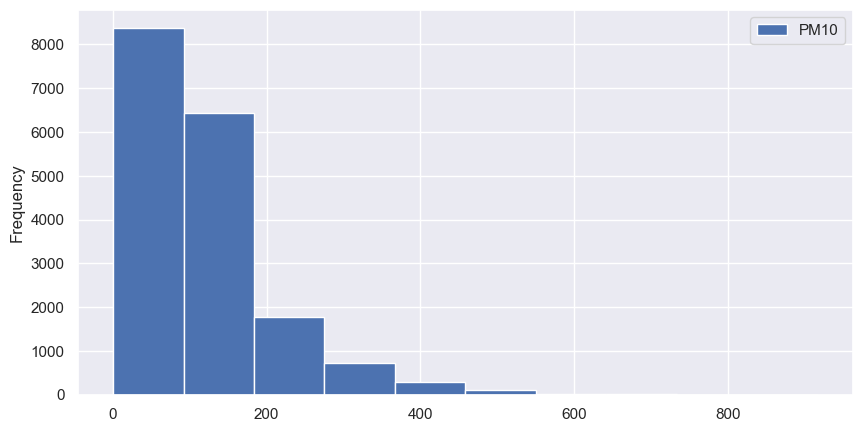

In [33]:
data["PM10"].plot(kind='hist', figsize=(10, 5))
plt.legend()
plt.show()

In [34]:
data =  data.replace({

"PM2.5" : {np.nan:67.476613},

"PM10" : {np.nan:118.454435},

"NO": {np.nan:17.622421},

"NO2": {np.nan:28.978391},

"NOX": {np.nan:32.289012},

"NH3": {np.nan:23.848366},

"CO": {np.nan: 2.345267},

"S02": {np.nan:34.912885},

"03": {np.nan:38.320547},

"Benzene": {np.nan:3.458668},

"Toluene": {np.nan:9.525714},

"Xylene": {np.nan:3.588683}})

<Axes: >

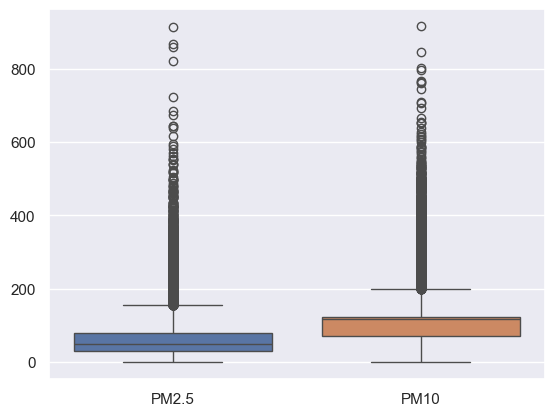

In [35]:
sns.boxplot(data=data[[ 'PM2.5', 'PM10']])

In [38]:
def replace_outliers_with_quartiles(df):

    for column in df.select_dtypes(include=['number']).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        df[column] = df[column].apply(
            lambda x: Q1 if x < lower_bound else (Q3 if x > upper_bound else x)

    )
    return df

df = replace_outliers_with_quartiles(data)


<Axes: >

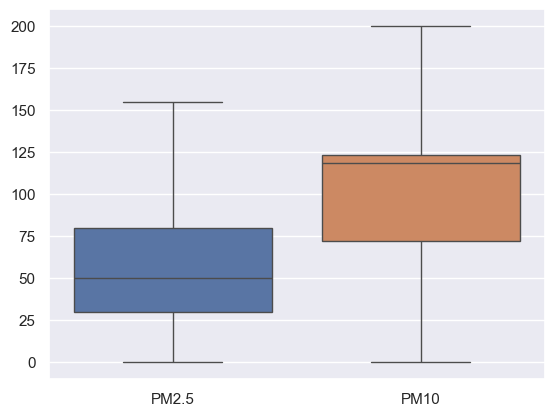

In [39]:
sns.boxplot(data=data[[ 'PM2.5', 'PM10']])

<Axes: >

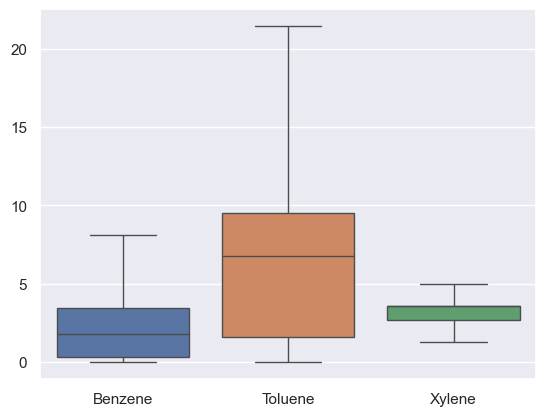

In [40]:
sns.boxplot(data=data[[ 'Benzene', 'Toluene', 'Xylene']])

<Axes: >

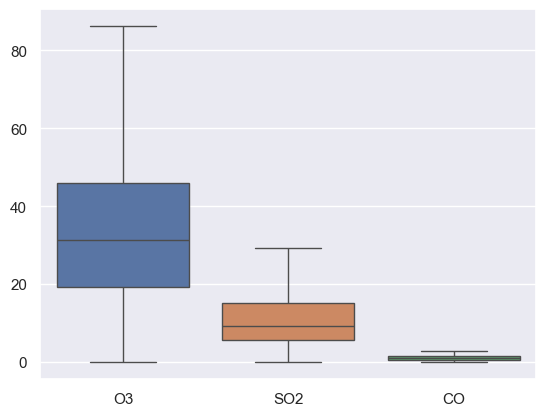

In [41]:
sns.boxplot(data=data[['O3', 'SO2', 'CO']])

<Axes: >

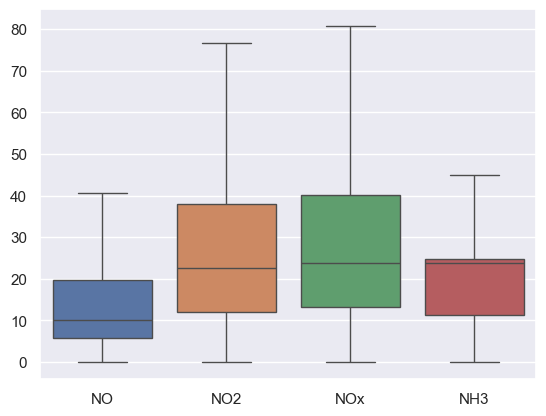

In [42]:
sns.boxplot(data=data[['NO', 'NO2', 'NOx', 'NH3']])

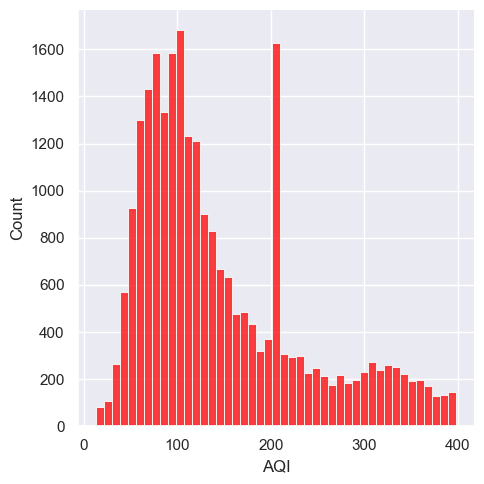

In [43]:
sns.displot(df, x='AQI', color='red')
plt.show()

In [49]:
data.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
28,Ahmedabad,83.1300,118.454435,6.93,28.71,33.72,23.848366,1.53,15.14,59.76,0.02,0.00,3.140000,209.0
29,Ahmedabad,79.8400,118.454435,13.85,28.68,41.08,23.848366,1.53,15.14,46.08,0.04,0.00,4.810000,328.0
30,Ahmedabad,94.5200,118.454435,24.39,32.66,52.61,23.848366,1.53,15.14,46.08,0.24,0.01,3.588683,208.0
31,Ahmedabad,135.9900,118.454435,19.71,42.08,40.17,23.848366,1.53,15.14,46.08,0.40,0.04,3.588683,208.0
32,Ahmedabad,79.5075,118.454435,19.71,35.31,72.80,23.848366,1.53,15.14,46.08,0.46,0.06,3.588683,208.0


In [50]:
data.drop(columns=['City'], inplace=True)

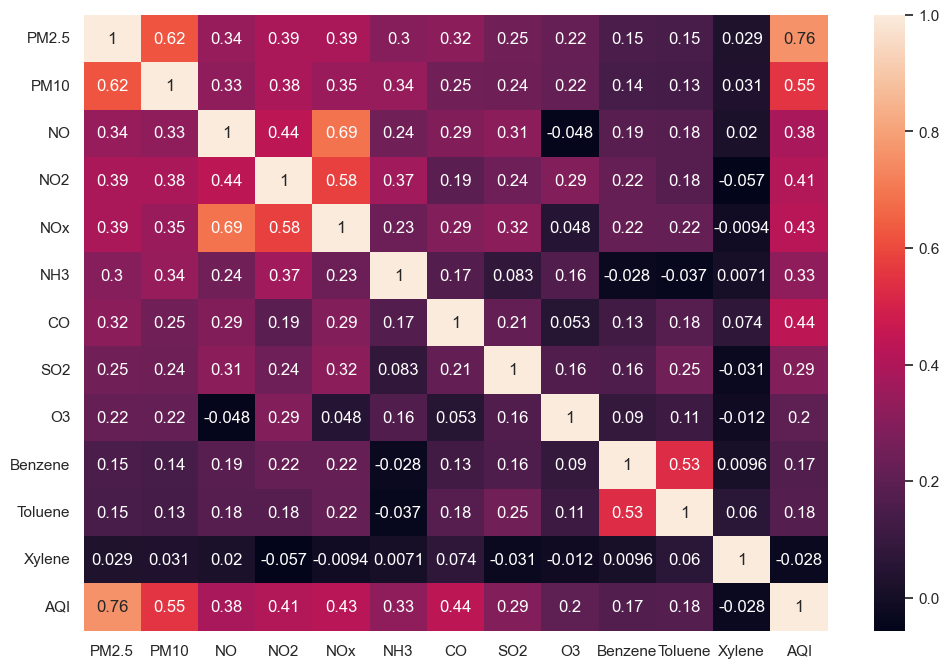

In [51]:
plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(), annot=True)
plt.show()

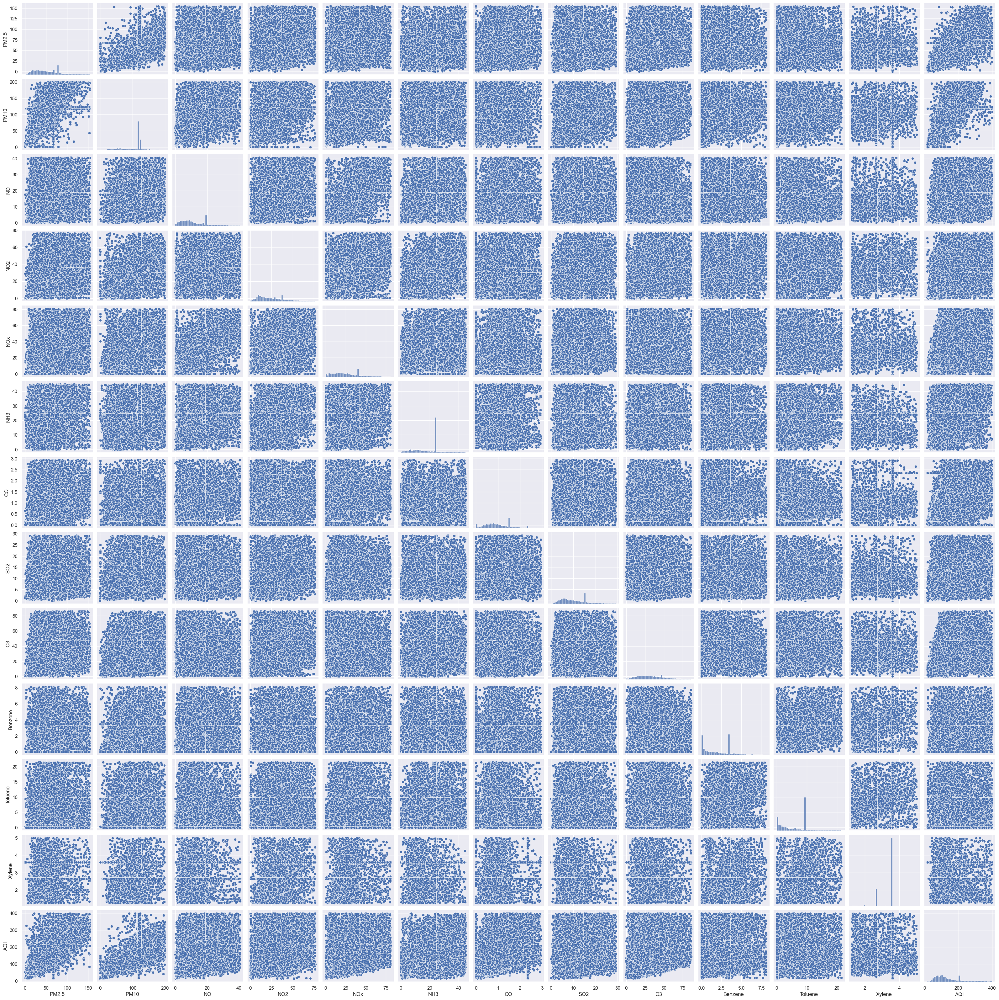

In [52]:
sns.pairplot(data)
plt.show()

In [53]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

In [54]:
x=df[["PM2.5","PM10","NO","NO2","NOx","NH3","CO","SO2","O3","Benzene","Toluene","Xylene"]]
y=df["AQI"]

In [55]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
print(f"x_train shape: {x_train.shape}, x_test shape: {x_test.shape}")

x_train shape: (19880, 12), x_test shape: (4970, 12)


In [56]:
#liner regression
model = LinearRegression()
model.fit(x_train, y_train)

ValueError: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values